# Identifying ATLAS stream members with a Baysian mixture model
Andrew Li | 1006675625

https://docs.google.com/document/d/1sj-IO7GDtVH2AUmS20DEwrZGI_2lWqvRnIx0dS4hmxY/edit

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy import table
import matplotlib

import emcee
import corner

from collections import OrderedDict
import time

from scipy import optimize, stats

In [2]:
font = {'size'   : 16}

matplotlib.rc('font', **font)

## 1. Collecting ATLAS data from S5 and results from Li et al. 2021

In [3]:
# S5 data
with fits.open('/home/t/tingli/tingli/data/S5/s5cat_dr3_5.fits') as hdu_list:
    table_S5_full = table.Table(hdu_list[1].data)
    
# ATLAS members in Li+2021
with fits.open('/home/t/tingli/tingli/data/S5/all_streams_DR3_v7_snr5_McMillan17Best.fits') as hdu_list:
    stream_mem = table.Table(hdu_list[1].data)

In [4]:
# Selecting ATLAS members

atlas_data = table_S5_full[table_S5_full['object_name'] == 'Atlas']
atlas_mem = stream_mem[stream_mem['regionname'] == 'AAU']

In [5]:
atlas_data

vel_blue1,vel_blue16,vel_blue50,vel_blue84,vel_blue99,vel_blue_mean,vel_blue_std,vel_blue_kurt,vel_blue_skew,vel1,vel16,vel50,vel84,vel99,vel_mean,vel_std,vel_kurt,vel_skew,teff1,teff16,teff50,teff84,teff99,teff_mean,teff_std,teff_kurt,teff_skew,logg1,logg16,logg50,logg84,logg99,logg_mean,logg_std,logg_kurt,logg_skew,feh1,feh16,feh50,feh84,feh99,feh_mean,feh_std,feh_kurt,feh_skew,alpha1,alpha16,alpha50,alpha84,alpha99,alpha_mean,alpha_std,alpha_kurt,alpha_skew,log_esys1,log_esys16,log_esys50,log_esys84,log_esys99,log_esys_mean,log_esys_std,log_esys_kurt,log_esys_skew,name,field,ra,dec,utmjd,comment,comment.mask,fileinfo,fig_name,proc_file_list,nspec_580v,nspec_1700d,utmjd_mean,prior_type,chisq_580v_0,chisq_580v_0.mask,chisq_1700d_0,chisq_1700d_0.mask,redchisq_580v_0,redchisq_580v_0.mask,redchisq_1700d_0,redchisq_1700d_0.mask,chisq_cont_580v_0,chisq_cont_580v_0.mask,chisq_cont_1700d_0,chisq_cont_1700d_0.mask,sn_580v_0,sn_580v_0.mask,sn_1700d_0,sn_1700d_0.mask,absdev_580v_0,absdev_580v_0.mask,absdev_1700d_0,absdev_1700d_0.mask,fname,chisq_580v_1,chisq_580v_1.mask,redchisq_580v_1,redchisq_580v_1.mask,chisq_cont_580v_1,chisq_cont_580v_1.mask,sn_580v_1,sn_580v_1.mask,absdev_580v_1,absdev_580v_1.mask,chisq_1700d_1,chisq_1700d_1.mask,redchisq_1700d_1,redchisq_1700d_1.mask,chisq_cont_1700d_1,chisq_cont_1700d_1.mask,sn_1700d_1,sn_1700d_1.mask,absdev_1700d_1,absdev_1700d_1.mask,chisq_580v_2,chisq_580v_2.mask,chisq_1700d_2,chisq_1700d_2.mask,redchisq_580v_2,redchisq_580v_2.mask,redchisq_1700d_2,redchisq_1700d_2.mask,chisq_cont_580v_2,chisq_cont_580v_2.mask,chisq_cont_1700d_2,chisq_cont_1700d_2.mask,sn_580v_2,sn_580v_2.mask,sn_1700d_2,sn_1700d_2.mask,absdev_580v_2,absdev_580v_2.mask,absdev_1700d_2,absdev_1700d_2.mask,chisq_580v_3,chisq_580v_3.mask,chisq_1700d_3,chisq_1700d_3.mask,redchisq_580v_3,redchisq_580v_3.mask,redchisq_1700d_3,redchisq_1700d_3.mask,chisq_cont_580v_3,chisq_cont_580v_3.mask,chisq_cont_1700d_3,chisq_cont_1700d_3.mask,sn_580v_3,sn_580v_3.mask,sn_1700d_3,sn_1700d_3.mask,absdev_580v_3,absdev_580v_3.mask,absdev_1700d_3,absdev_1700d_3.mask,chisq_580v_4,chisq_580v_4.mask,chisq_580v_5,chisq_580v_5.mask,chisq_1700d_4,chisq_1700d_4.mask,chisq_1700d_5,chisq_1700d_5.mask,redchisq_580v_4,redchisq_580v_4.mask,redchisq_580v_5,redchisq_580v_5.mask,redchisq_1700d_4,redchisq_1700d_4.mask,redchisq_1700d_5,redchisq_1700d_5.mask,chisq_cont_580v_4,chisq_cont_580v_4.mask,chisq_cont_580v_5,chisq_cont_580v_5.mask,chisq_cont_1700d_4,chisq_cont_1700d_4.mask,chisq_cont_1700d_5,chisq_cont_1700d_5.mask,sn_580v_4,sn_580v_4.mask,sn_580v_5,sn_580v_5.mask,sn_1700d_4,sn_1700d_4.mask,sn_1700d_5,sn_1700d_5.mask,absdev_580v_4,absdev_580v_4.mask,absdev_580v_5,absdev_580v_5.mask,absdev_1700d_4,absdev_1700d_4.mask,absdev_1700d_5,absdev_1700d_5.mask,ebv,gaia_source_id,dr2_source_id,phot_bp_rp_excess_factor,parallax,parallax_error,phot_g_mean_mag,source_id,pmra,pmdec,pmra_error,pmdec_error,pmra_pmdec_corr,phot_bp_mean_mag,phot_rp_mean_mag,r_med_geo,r_lo_geo,r_hi_geo,r_med_photogeo,r_lo_photogeo,r_hi_photogeo,bjdist_flag,w1mpro,w2mpro,w1sigmpro,w2sigmpro,j_2mass,h_2mass,k_2mass,u_skm,e_u_skm,v_skm,e_v_skm,g_skm,e_g_skm,r_skm,e_r_skm,i_skm,e_i_skm,z_skm,e_z_skm,starhorse_dist05,starhorse_dist16,starhorse_dist50,starhorse_dist84,starhorse_dist95,decam_g,decam_r,decam_i,decam_z,decam_phot_src_bits,qso_flag_wise,priority,object_name,sesar_s3ab,sesar_s3c,gaia_rr,p_bhb_decals,best_chisq_580v,best_absdev_580v,best_sn_580v,best_chisq_1700d,best_absdev_1700d,best_sn_1700d,good_star_pb,good_star,vel_calib,vel_calib_std,feh_calib_std
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float6

## 2. Transform the stars in stream coordinates (phi1, phi2)

In [6]:
# convert ra/dec to phi1/phi2, with rotation matrix given.

def phi12_rotmat(alpha,delta,R_phi12_radec):
    '''
    Converts coordinates (alpha,delta) to ones defined by a rotation matrix R_phi12_radec, applied on the original coordinates

    Critical: All angles must be in degrees
    
    Parameters:
    alpha - float. Right ascension
    delta - float. Declination
    R_phi12_radec - 3x3 array. Rotation matrix
    
    Returns:
    [phi1,phi2] - the transformed stream coordinates as a size 2 array.
    '''
    
    vec_radec = np.array([np.cos(alpha*np.pi/180.)*np.cos(delta*np.pi/180.),
                          np.sin(alpha*np.pi/180.)*np.cos(delta*np.pi/180.),
                          np.sin(delta*np.pi/180.)])

    vec_phi12 = np.zeros(np.shape(vec_radec))
    
    vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
    vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
    vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))
    
    vec_phi12 = vec_phi12.T

    vec_phi12 = np.dot(R_phi12_radec,vec_radec).T

    phi1 = np.arctan2(vec_phi12[:,1],vec_phi12[:,0])*180./np.pi
    phi2 = np.arcsin(vec_phi12[:,2])*180./np.pi


    return [phi1,phi2]


In [7]:
# Rotation matrix in Ship et al. 2019

smatrix = [[0.83697865, 0.29481904, -0.4610298], 
           [0.51616778, -0.70514011, 0.4861566], 
           [0.18176238, 0.64487142, 0.74236331]]

In [8]:
# Convert equitorial to stream

atlas_data['phi1'], atlas_data['phi2'] = phi12_rotmat(atlas_data['ra'],atlas_data['dec'],smatrix)
atlas_mem['phi1'], atlas_mem['phi2'] = phi12_rotmat(atlas_mem['ra'],atlas_mem['dec'],smatrix)



/tmp/ipykernel_200033/4032752666.py:24: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
/tmp/ipykernel_200033/4032752666.py:25: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
/tmp/ipykernel_200033/4032752666.py:26: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))


[Text(0.5, 0, '$\\phi_1$ [deg]'),
 Text(0, 0.5, '$\\phi_2$ [deg]'),
 (-20.0, 25.0)]

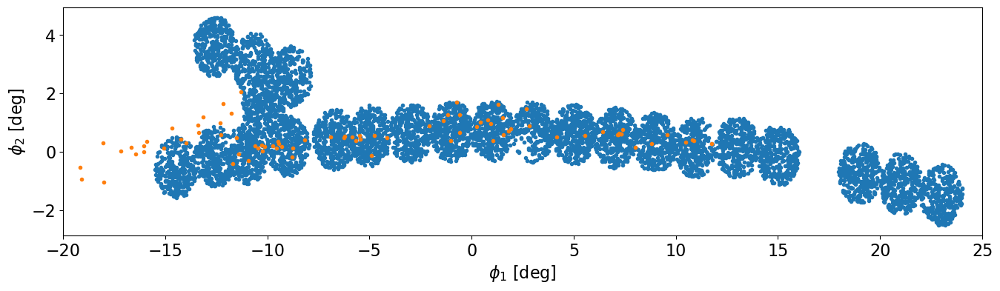

In [9]:
# Check

fig, ax = plt.subplots(figsize=(16,4))

ax.plot(atlas_data['phi1'], atlas_data['phi2'],'.')
ax.plot(atlas_mem['phi1'], atlas_mem['phi2'],'.')
ax.set(xlabel="$\phi_1$ [deg]", ylabel="$\phi_2$ [deg]", xlim=(-20,25))

## 3. Convert heliocentric velocity to Galactic Standard of Rest (GSR).

In [10]:
#taken from 
#https://docs.astropy.org/en/stable/generated/examples/coordinates/rv-to-gsr.html
def rv_to_gsr(c, v_sun=None):
    """Transform a barycentric radial velocity to the Galactic Standard of Rest
    (GSR).

    The input radial velocity must be passed in as a

    Parameters
    ----------
    c : `~astropy.coordinates.BaseCoordinateFrame` subclass instance
        The radial velocity, associated with a sky coordinates, to be
        transformed.
    v_sun : `~astropy.units.Quantity`, optional
        The 3D velocity of the solar system barycenter in the GSR frame.
        Defaults to the same solar motion as in the
        `~astropy.coordinates.Galactocentric` frame.

    Returns
    -------
    v_gsr : `~astropy.units.Quantity`
        The input radial velocity transformed to a GSR frame.

    """
    if v_sun is None:
        v_sun = coord.Galactocentric().galcen_v_sun.to_cartesian()

    gal = c.transform_to(coord.Galactic)
    cart_data = gal.data.to_cartesian()
    unit_vector = cart_data / cart_data.norm()

    v_proj = v_sun.dot(unit_vector)

    return c.radial_velocity + v_proj

import astropy.coordinates as coord
import astropy.units as u
coord.galactocentric_frame_defaults.set('latest')


#Convert
icrs = coord.SkyCoord(ra=atlas_data['ra']*u.deg, dec=atlas_data['dec']*u.deg,
                      radial_velocity=atlas_data['vel_calib']*u.km/u.s, frame='icrs')
atlas_data['vgsr'] = rv_to_gsr(icrs)


icrs = coord.SkyCoord(ra=atlas_mem['ra']*u.deg, dec=atlas_mem['dec']*u.deg,
                      radial_velocity=atlas_mem['vel_calib']*u.km/u.s, frame='icrs')
atlas_mem['vgsr'] = rv_to_gsr(icrs)

Text(0, 0.5, 'v_helio')

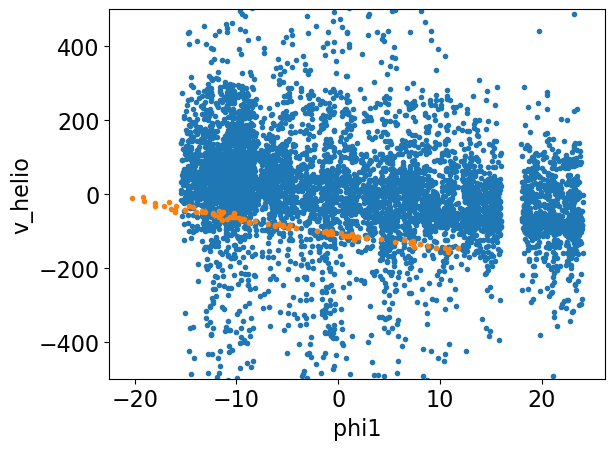

In [11]:
# vhel

plt.plot(atlas_data['phi1'], atlas_data['vel_calib'],'.')
plt.plot(atlas_mem['phi1'], atlas_mem['vel_calib'],'.')
plt.ylim(-500,500)
plt.xlabel('phi1')
plt.ylabel('v_helio')

Text(0, 0.5, 'v_gsr')

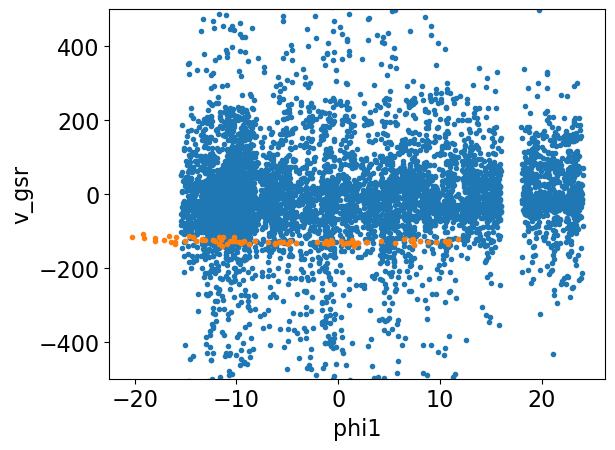

In [12]:
# vgsr

plt.plot(atlas_data['phi1'], atlas_data['vgsr'],'.')
plt.plot(atlas_mem['phi1'], atlas_mem['vgsr'],'.')
plt.ylim(-500,500)
plt.xlabel('phi1')
plt.ylabel('v_gsr')

## 4. Reproducing Figure 2

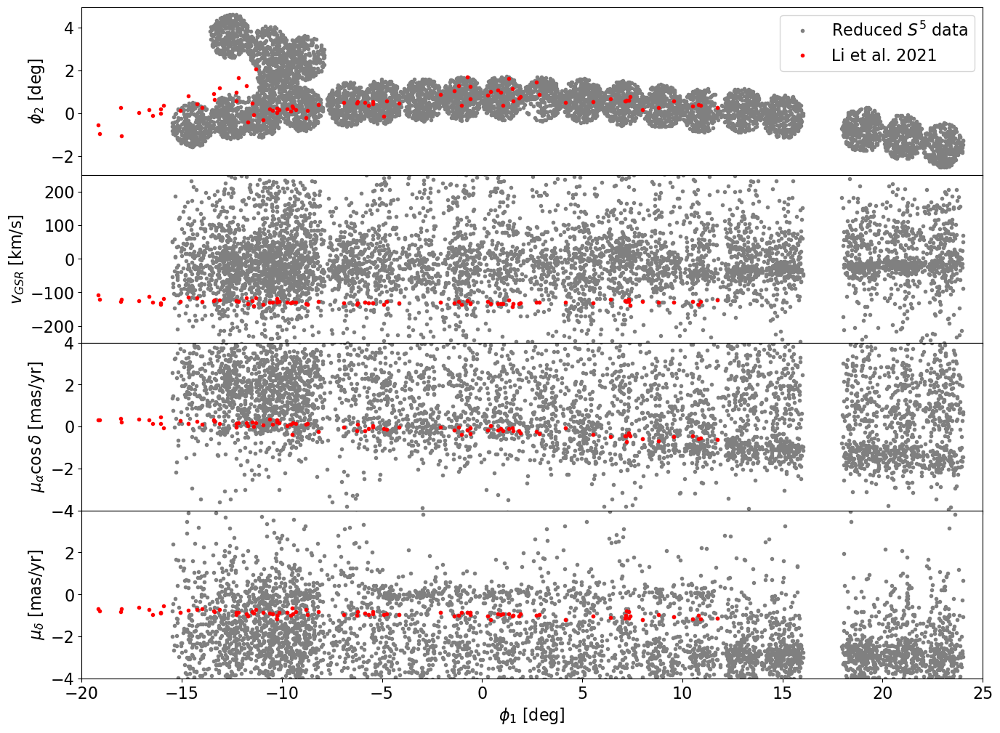

In [13]:
fig, ax = plt.subplots(4,1,figsize=(16,12),sharex=True)

ax[0].plot(atlas_data['phi1'], atlas_data['phi2'],'.',color='grey',label='Reduced $S^5$ data')
ax[0].plot(atlas_mem['phi1'], atlas_mem['phi2'],'.',color='r',label='Li et al. 2021')

ax[1].plot(atlas_data['phi1'], atlas_data['vgsr'],'.',color='grey')
ax[1].plot(atlas_mem['phi1'], atlas_mem['vgsr'],'.',color='r')

ax[2].plot(atlas_data['phi1'], atlas_data['pmra'],'.',color='grey')
ax[2].plot(atlas_mem['phi1'], atlas_mem['pmra'],'.',color='r')

ax[3].plot(atlas_data['phi1'], atlas_data['pmdec'],'.',color='grey')
ax[3].plot(atlas_mem['phi1'], atlas_mem['pmdec'],'.',color='r')

ax[0].legend()

ax[0].set_ylabel('$\phi_2$ [deg]')
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]',ylim=(-250,250))
ax[2].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]',ylim=(-4,4))
ax[3].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]', xlim=(-20,25),ylim=(-4,4))
plt.subplots_adjust(hspace=0)

## 5. The Model

In [14]:
# Data cuts

quality_cuts = (atlas_data['feh50'] < 0) \
               & (atlas_data['phi1'] < 10) & (atlas_data['phi1'] > -10) \
               & (atlas_data['vgsr'] < 250) & (atlas_data['vgsr'] > -250) \
               & (atlas_data['pmra'] < 4) & (atlas_data['pmra'] > -4) \
               & (atlas_data['pmdec'] < 4) & (atlas_data['pmdec'] > -4) \
               & (atlas_data['good_star'] == 1)

atlas_data_red = atlas_data[quality_cuts]

# stars before and after cut
print(len(atlas_data),len(atlas_data_red))

7982 1204


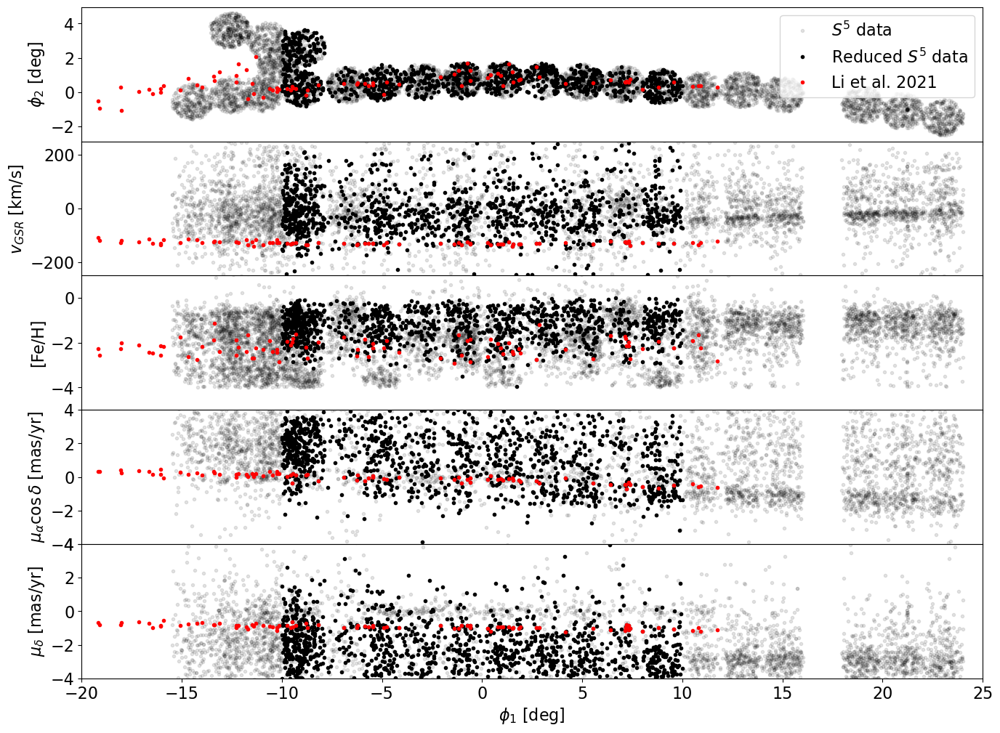

In [15]:
# Figure 1 in report

fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)

ax[0].plot(atlas_data['phi1'], atlas_data['phi2'],'.',color='k',alpha=0.1,label='$S^5$ data')
ax[0].plot(atlas_data_red['phi1'], atlas_data_red['phi2'],'.',color='k',label='Reduced $S^5$ data')
ax[0].plot(atlas_mem['phi1'], atlas_mem['phi2'],'.',color='r',label='Li et al. 2021')

ax[1].plot(atlas_data['phi1'], atlas_data['vgsr'],'.',color='k',alpha=0.1)
ax[1].plot(atlas_data_red['phi1'], atlas_data_red['vgsr'],'.',color='k')
ax[1].plot(atlas_mem['phi1'], atlas_mem['vgsr'],'.',color='r')

ax[2].plot(atlas_data['phi1'], atlas_data['feh50'],'.',color='k',alpha=0.1)
ax[2].plot(atlas_data_red['phi1'], atlas_data_red['feh50'],'.',color='k')
ax[2].plot(atlas_mem['phi1'], atlas_mem['feh50'],'.',color='r')

ax[3].plot(atlas_data['phi1'], atlas_data['pmra'],'.',color='k',alpha=0.1)
ax[3].plot(atlas_data_red['phi1'], atlas_data_red['pmra'],'.',color='k')
ax[3].plot(atlas_mem['phi1'], atlas_mem['pmra'],'.',color='r')

ax[4].plot(atlas_data['phi1'], atlas_data['pmdec'],'.',color='k',alpha=0.1)
ax[4].plot(atlas_data_red['phi1'], atlas_data_red['pmdec'],'.',color='k')
ax[4].plot(atlas_mem['phi1'], atlas_mem['pmdec'],'.',color='r')

ax[0].legend()

ax[0].set_ylabel('$\phi_2$ [deg]')
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]',ylim=(-250,250))
ax[2].set(ylabel=r'[Fe/H]',ylim=(-5,1))
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]',ylim=(-4,4))
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]', xlim=(-20,25),ylim=(-4,4))
plt.subplots_adjust(hspace=0)

In [21]:
param_labels = ["pstream",
                "v1","lsigv",
                "feh1","lsigfeh",
                "pmra1","lsigpmra",
                "pmdec1","lsigpmdec",
                "bv", "lsigbv", "bfeh", "lsigbfeh", "bpmra", "lsigbpmra", "bpmdec", "lsigbpmdec"]


def lnprob(theta, vgsr, feh, pmra, pmdec, phi1):
    """ Likelihood and Prior """
    
    # params
    pstream, \
    v1, lsigv, \
    feh1, lsigfeh, \
    pmra1, lsigpmra, \
    pmdec1, lsigpmdec, \
    bv, lsigbv, bfeh, lsigbfeh, bpmra, lsigbpmra, bpmdec, lsigbpmdec = theta
    
    
    # The prior
    if (pstream > 1) or (pstream < 0) or \
        (lsigv > 4) or (lsigfeh > 4) or (lsigpmra > 3) or (lsigpmdec > 3) or \
        (lsigv < -1) or (lsigfeh < -2) or (lsigpmra < -1) or (lsigpmdec < -2) or \
        (lsigbv > 4) or (lsigbfeh > 3) or (lsigbpmra > 3) or (lsigbpmdec > 3) or \
        (lsigbv < -1) or (lsigbfeh < -1) or (lsigbpmra < -1) or (lsigbpmdec < -2) or \
        (v1 > -100) or (v1 < -160) or \
        (feh1 > 0) or (feh1 < -4) or \
        (pmra1 > 1) or (pmra1 < -1) or \
        (pmdec1 > 0) or (pmdec1 < -2) or \
        (bv > 50) or (bv < -50) or (bfeh > 1) or (bfeh < -5) or (bpmra > 2) or (bpmra < 0) or (bpmdec > 0) or (bpmdec < -4):
        return -1e10 # outside of prior, return a tiny number
    
    ## Compute log likelihood in v_gsr
    lstream_v = stats.norm.logpdf(vgsr, loc=v1, scale=10**lsigv)
    lbg_v = stats.norm.logpdf(vgsr, loc=bv, scale=10**lsigbv)
    
    ## Compute log likelihood in feh
    lstream_feh = stats.norm.logpdf(feh, loc=feh1, scale=10**lsigfeh)
    lbg_feh = stats.norm.logpdf(feh, loc=bfeh, scale=10**lsigbfeh)
    
    ## Compute log likelihood in pmra
    lstream_pmra = stats.norm.logpdf(pmra, loc=pmra1, scale=10**lsigpmra)
    lbg_pmra = stats.norm.logpdf(pmra, loc=bpmra, scale=10**lsigbpmra)

    ## Compute log likelihood in pmdec
    lstream_pmdec = stats.norm.logpdf(pmdec, loc=pmdec1, scale=10**lsigpmdec)
    lbg_pmdec = stats.norm.logpdf(pmdec, loc=bpmdec, scale=10**lsigbpmdec)

    ## Combine the components
    lstream = np.log(pstream) + lstream_v + lstream_feh + lstream_pmra + lstream_pmdec
    lbg = np.log(1-pstream) + lbg_v + lbg_feh + lbg_pmra + lbg_pmdec
    ltot = np.logaddexp(lstream, lbg)
    
    return np.sum(ltot)

def get_paramdict(theta):
    '''Make an ordered disctionary of the parameters as keys and inputted theta as values'''
    return OrderedDict(zip(param_labels, theta))

def project_model(theta, vgsr_min, vgsr_max, feh_min, feh_max, pmra_min, pmra_max, pmdec_min, pmdec_max):
    """ Turn parameters into vgsr, pmra, pmdec distributions. An aproximation since no phi dependence"""
    params = get_paramdict(theta)
    
    vgsr_arr = np.linspace(vgsr_min, vgsr_max, 1000)
    feh_arr = np.linspace(feh_min, feh_max, 1000)
    pmra_arr = np.linspace(pmra_min, pmra_max, 1000)
    pmdec_arr = np.linspace(pmdec_min, pmdec_max, 1000)
    
    pvgsr0 = params['pstream']*stats.norm.pdf(vgsr_arr, loc=params['v1'], scale=10**params['lsigv'])
    pvgsr1 = (1-params['pstream'])*stats.norm.pdf(vgsr_arr, loc=params['bv'], scale=10**params['lsigbv'])
    
    pfeh0 = params['pstream']*stats.norm.pdf(feh_arr, loc=params['feh1'], scale=10**params['lsigfeh'])
    pfeh1 = (1-params['pstream'])*stats.norm.pdf(feh_arr, loc=params['bfeh'], scale=10**params['lsigbfeh'])
    
    ppmra0 = params['pstream']*stats.norm.pdf(pmra_arr, loc=params['pmra1'], scale=10**params['lsigpmra'])
    ppmra1 = (1-params['pstream'])*stats.norm.pdf(pmra_arr, loc=params['bpmra'], scale=10**params['lsigbpmra'])
    
    ppmdec0 = params['pstream']*stats.norm.pdf(pmdec_arr, loc=params['pmdec1'], scale=10**params['lsigpmdec'])
    ppmdec1 = (1-params['pstream'])*stats.norm.pdf(pmdec_arr, loc=params['bpmdec'], scale=10**params['lsigbpmdec'])
    
    return vgsr_arr, pvgsr0, pvgsr1, feh_arr, pfeh0, pfeh1, pmra_arr, ppmra0, ppmra1, pmdec_arr, ppmdec0, ppmdec1

def plot_1d_distrs(theta):
    '''
    Plots the distributions of vgsr, feh, pmra, pmdec
    '''
    colors = list(plt.rcParams["axes.prop_cycle"].by_key()["color"])
    model_output = project_model(theta,-300,300,-5,5,-5,5,-5,5)
    
    
    fig, axes = plt.subplots(2,2,figsize=(14,14))
    
    #vgsr
    ax = axes[0][0]
    ax.hist(atlas_data_red['vgsr'], density=True, color='grey', bins='auto')
    xp, p0, p1 = model_output[0:3]
    ax.plot(xp, p0 + p1, 'k-', label='total', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], label='bg', lw=3)
    ax.plot(xp, p0, ':', color=colors[0], label='stream', lw=3)
    ax.set_xlabel('vgsr')
    ax.legend(fontsize='small')

    # pmra
    ax = axes[0][1]
    ax.hist(atlas_data_red['feh50'], density=True, color='grey', bins='auto')
    xp, p0, p1 = model_output[3:6]
    ax.plot(xp, p0 + p1, 'k-', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], lw=3)
    ax.plot(xp, p0, ':', color=colors[0], lw=3)
    ax.set_xlabel('feh')
    
    # pmra
    ax = axes[1][0]
    ax.hist(atlas_data_red['pmra'], density=True, color='grey', bins='auto')
    xp, p0, p1 = model_output[6:9]
    ax.plot(xp, p0 + p1, 'k-', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], lw=3)
    ax.plot(xp, p0, ':', color=colors[0], lw=3)
    ax.set_xlabel('pmra')
    
    # pmdec
    ax = axes[1][1]
    ax.hist(atlas_data_red['pmdec'], density=True, color='grey', bins='auto')
    xp, p0, p1 = model_output[9:12]
    ax.plot(xp, p0 + p1, 'k-', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], lw=3)
    ax.plot(xp, p0, ':', color=colors[0], lw=3)
    ax.set_xlabel('pmdec')
    return fig

## 6. Parameter optimization with scipy

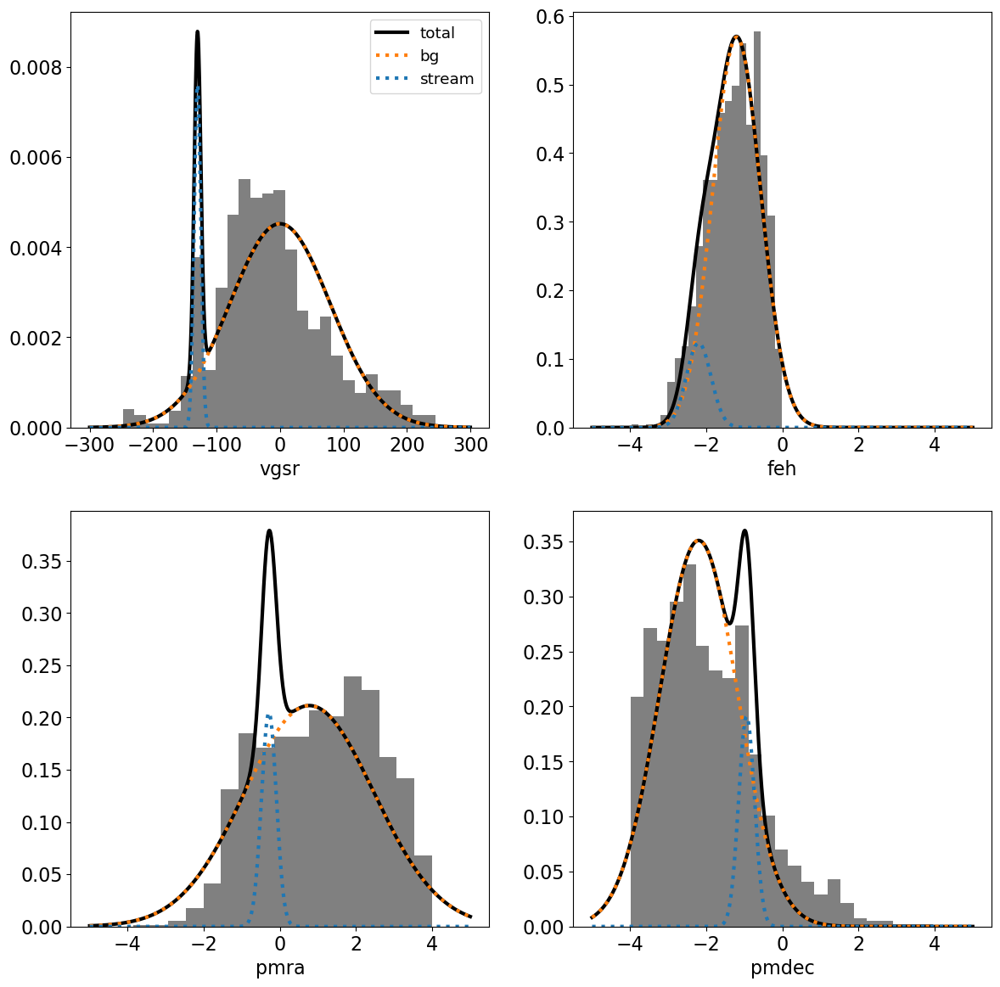

In [22]:
# Mess around until a good initial guess

p0_guess = [0.1,
            -130, 0.72,
            -2.2, -0.49,
            -0.29, -0.71,
            -0.94, -0.68,
            0, 1.9, -1.2, -0.2, 0.77, 0.23, -2.2, 0.01]
fig = plot_1d_distrs(p0_guess)

In [23]:
# Using scipy minimize to optimize the parameters a bit first so that it is easier on emcee

optfunc = lambda theta: -lnprob(theta, atlas_data_red['vgsr'], atlas_data_red['feh50'], atlas_data_red['pmra'],
                                atlas_data_red['pmdec'], atlas_data_red['phi1'])
%time result = optimize.minimize(optfunc, p0_guess, method="Nelder-Mead")
print(result.message)

output = get_paramdict(result.x)
for label, value in output.items():
    print(label, value)

CPU times: user 2.92 s, sys: 8.6 ms, total: 2.93 s
Wall time: 2.93 s
Maximum number of function evaluations has been exceeded.
pstream 0.05180710624848747
v1 -130.58855138247458
lsigv 0.655667564067197
feh1 -2.2702363010797835
lsigfeh -0.5049328370504975
pmra1 -0.17807412382663543
lsigpmra -0.6063747383318381
pmdec1 -0.9626234413449364
lsigpmdec -0.9620130331771906
bv 0.01702781771993243
lsigbv 1.9268490108618042
bfeh -1.236948950997257
lsigbfeh -0.18277112463483447
bpmra 1.1285536091761643
lsigbpmra 0.1862853677462561
bpmdec -2.0230645577832354
lsigbpmdec 0.1295728794871589


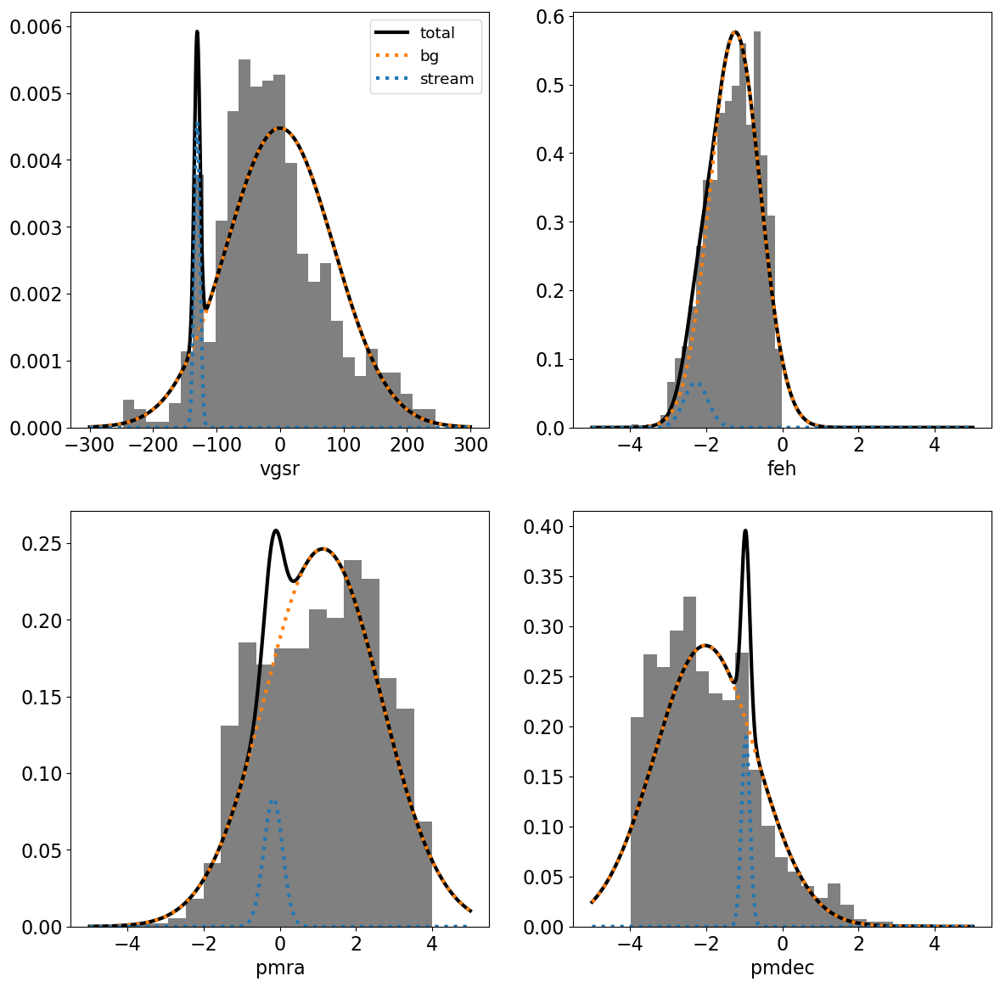

In [24]:
# Check
fig1 = plot_1d_distrs(result.x)

## 6. MCMC sampling

In [25]:
# Set up, differ initial starting positions in parameter space

nparams = len(param_labels)
print(nparams)
nwalkers = 64
p0 = result.x
ep0 = np.zeros(len(p0)) + 0.007
p0s = np.random.multivariate_normal(p0, np.diag(ep0)**2, size=nwalkers)
## Check to see things are initialized ok
lkhds = [lnprob(p0s[j],atlas_data_red['vgsr'],atlas_data_red['feh50'], atlas_data_red['pmra'],
                atlas_data_red['pmdec'], atlas_data_red['phi1']) for j in range(nwalkers)]
print(lkhds)
assert np.all(np.array(lkhds) > -9e9)

17
[-12278.855575480995, -12278.609658810134, -12278.415046206002, -12279.473438841036, -12277.869662431145, -12281.210487122364, -12279.753968511503, -12282.569400671262, -12281.636770248158, -12280.759887673934, -12282.983003950492, -12281.664479784118, -12278.691208368771, -12278.501129710232, -12279.054899131272, -12279.238453316006, -12278.301027768097, -12279.460921606504, -12278.867611471265, -12279.806605805796, -12278.648798765564, -12279.72784594962, -12278.876765244573, -12279.16741648906, -12280.837438512543, -12278.890114945782, -12280.273644511795, -12279.83924389673, -12279.86031919298, -12280.201146310683, -12279.043798235409, -12280.372468512058, -12278.410149040254, -12282.503556048425, -12281.63703742997, -12277.836592929232, -12278.14032437325, -12280.620721149253, -12279.426563221972, -12278.446099134839, -12279.496855377076, -12279.378193319604, -12278.958555816585, -12280.330057896022, -12278.549794319173, -12280.669469803117, -12280.390702094292, -12281.43952861

In [26]:
%%time 
from schwimmbad import MultiPool

## Run emcee in parallel
nproc = 4
nstep = 2000

with MultiPool(nproc) as pool:
    print("Running burnin with {} iterations".format(nstep))
    start = time.time()
    es = emcee.EnsembleSampler(
        nwalkers, len(p0), lnprob,
        args=(atlas_data_red['vgsr'], atlas_data_red['feh50'],
              atlas_data_red['pmra'], atlas_data_red['pmdec'], atlas_data_red['phi1']),
        pool=pool)
    PP = es.run_mcmc(p0s, nstep)
    print("Took {:.1f} seconds".format(time.time()-start))
    
    print(f"Now running the actual thing")
    es.reset()
    start = time.time()
    es.run_mcmc(PP.coords, nstep)
    print("Took {:.1f} seconds".format(time.time()-start))
    
    chain = es.chain

Running burnin with 2000 iterations
Took 47.1 seconds
Now running the actual thing
Took 47.0 seconds
CPU times: user 59.2 s, sys: 12.8 s, total: 1min 11s
Wall time: 1min 34s


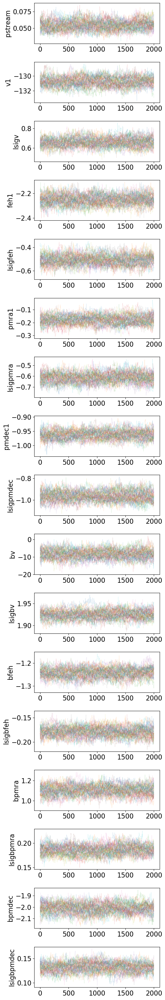

In [27]:
# Taking a look at the chains

Nrow = chain.shape[2]
fig, axes = plt.subplots(Nrow, figsize=(6,2*Nrow))
for iparam,ax in enumerate(axes):
    for j in range(nwalkers):
        ax.plot(chain[j,:,iparam], lw=.5, alpha=.2)
        ax.set_ylabel(param_labels[iparam])
fig.tight_layout()

In [28]:
chain = es.flatchain
chain.shape

(128000, 17)

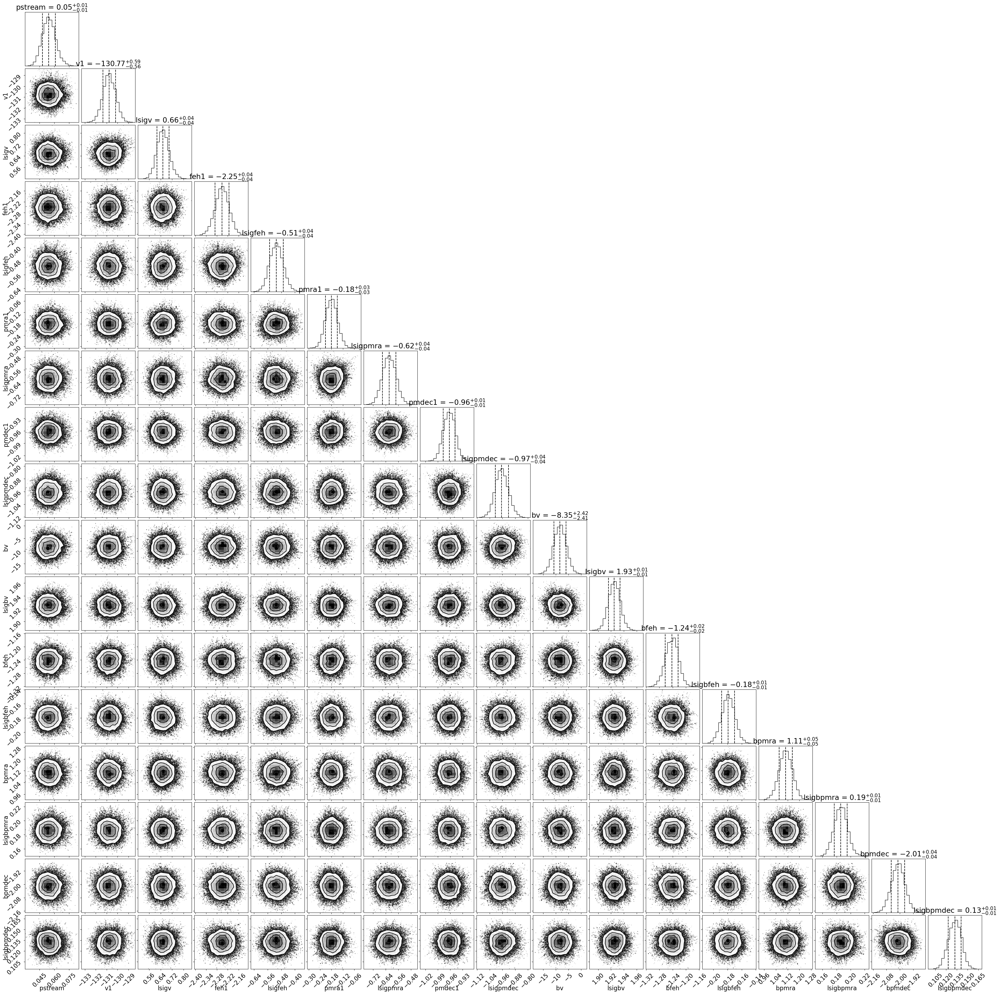

In [29]:
fig = corner.corner(chain, labels=param_labels, quantiles=[0.16,0.50,0.84], show_titles=True)

In [30]:
def process_chain(chain, avg_error=True):
    ''' Returns the means and errors of teh parameters
    
    Parameters:
    chain - array. The chain
    avg_error - bool. Will average the + and - errors if True
    
    Return:
    2 or 3 OrderedDict as a tuple. means, errors or means, errors+, errors-
    '''
    pctl = np.percentile(chain, [16, 50, 84], axis=0)
    meds = pctl[1]
    ep = pctl[2]-pctl[1]
    em = pctl[0]-pctl[1]
    if avg_error: # just for simplicity, assuming no asymmetry
        err = (ep-em)/2
        return OrderedDict(zip(param_labels, meds)), OrderedDict(zip(param_labels, err))
    else:
        return OrderedDict(zip(param_labels, meds)), OrderedDict(zip(param_labels, ep)), OrderedDict(zip(param_labels, em))

In [31]:
meds, errs = process_chain(chain)

In [32]:
for k,v in meds.items():
    print("{} {:.3f} {:.3f}".format(k, v, errs[k]))

pstream 0.054 0.007
v1 -130.771 0.575
lsigv 0.656 0.042
feh1 -2.251 0.038
lsigfeh -0.509 0.040
pmra1 -0.180 0.031
lsigpmra -0.618 0.042
pmdec1 -0.962 0.014
lsigpmdec -0.965 0.042
bv -8.355 2.415
lsigbv 1.925 0.009
bfeh -1.242 0.019
lsigbfeh -0.179 0.009
bpmra 1.106 0.045
lsigbpmra 0.186 0.009
bpmdec -2.011 0.041
lsigbpmdec 0.132 0.009


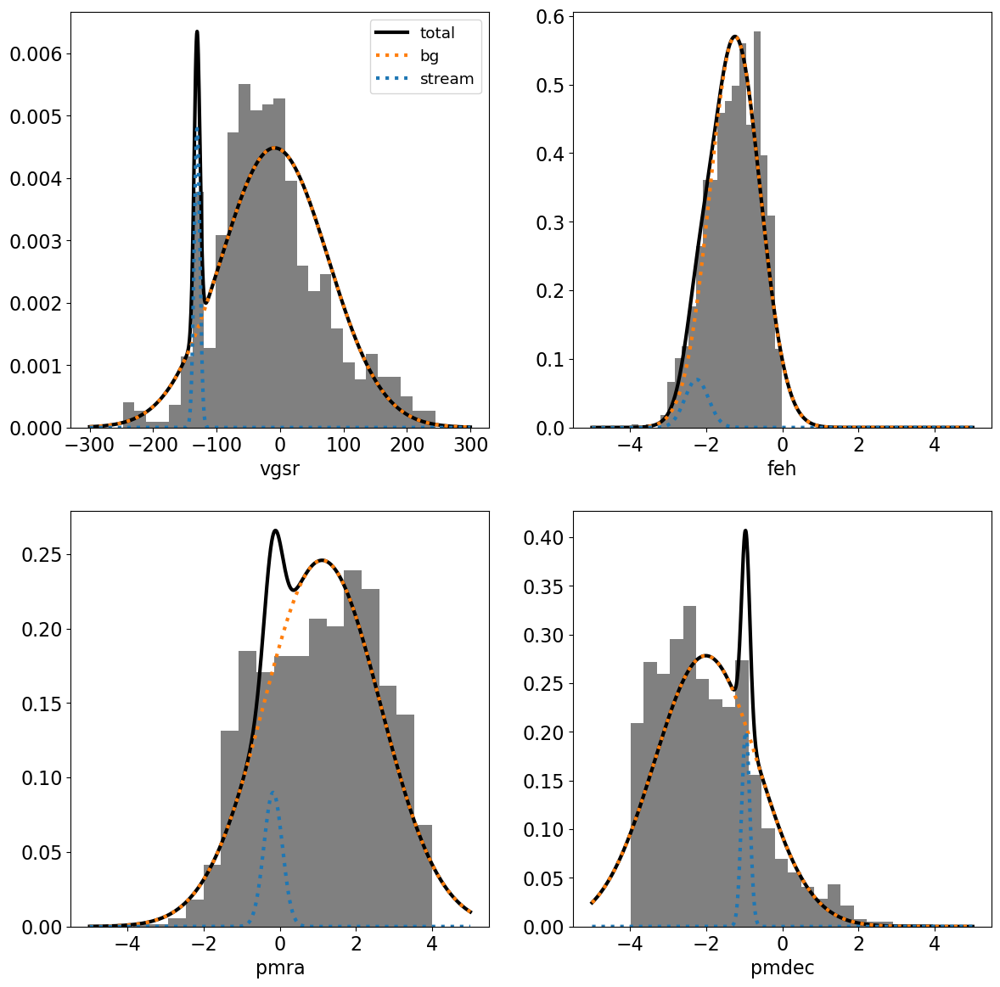

In [33]:
# Check

theta_final = []
for _,i in meds.items():
    theta_final.append(i)
fig1 = plot_1d_distrs(theta_final)

## 7. Membership probability

In [34]:
def memprob(theta, vgsr, feh, pmra, pmdec, phi1):
    """ Calculates membership probability based on inputs
    
    Parameters:
    theta - array. model parameters
    vgsr, pmra, pmdec, phi1 - floats. Respective values
    
    Return:
    float. The membership probability
    """
    # params
    pstream, \
    v1, lsigv, \
    feh1, lsigfeh, \
    pmra1, lsigpmra, \
    pmdec1, lsigpmdec, \
    bv, lsigbv, bfeh, lsigbfeh, bpmra, lsigbpmra, bpmdec, lsigbpmdec = theta
    
    ## Compute log likelihood in v_gsr
    lstream_v = stats.norm.logpdf(vgsr, loc=v1, scale=10**lsigv)
    lbg_v = stats.norm.logpdf(vgsr, loc=bv, scale=10**lsigbv)
    
    ## Compute log likelihood in feh
    lstream_feh = stats.norm.logpdf(feh, loc=feh1, scale=10**lsigfeh)
    lbg_feh = stats.norm.logpdf(feh, loc=bfeh, scale=10**lsigbfeh)
    
    ## Compute log likelihood in pmra
    lstream_pmra = stats.norm.logpdf(pmra, loc=pmra1, scale=10**lsigpmra)
    lbg_pmra = stats.norm.logpdf(pmra, loc=bpmra, scale=10**lsigbpmra)

    ## Compute log likelihood in pmdec
    lstream_pmdec = stats.norm.logpdf(pmdec, loc=pmdec1, scale=10**lsigpmdec)
    lbg_pmdec = stats.norm.logpdf(pmdec, loc=bpmdec, scale=10**lsigbpmdec)

    ## Combine the components
    lstream = np.log(pstream) + lstream_v + lstream_feh + lstream_pmra + lstream_pmdec
    lbg = np.log(1-pstream) + lbg_v + lbg_feh + lbg_pmra + lbg_pmdec
    
    stream = np.exp(lstream)
    bg = np.exp(lbg)
    
    p = (pstream*stream)/((pstream*stream)+(1-pstream)*bg)
    return p

In [35]:
stream_prob = memprob(theta_final,atlas_data_red['vgsr'],atlas_data_red['feh50'],atlas_data_red['pmra'],atlas_data_red['pmdec'],atlas_data_red['phi1'])

In [36]:
# Taking all p > threshold to be in the stream
threshold = 0.7

# number of members
print(len(stream_prob[stream_prob>threshold]))

60


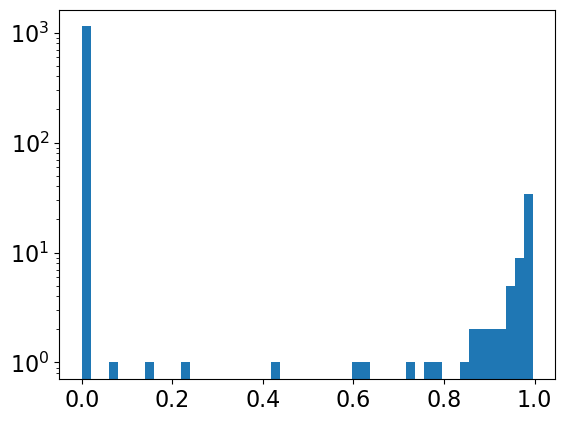

In [41]:
plt.hist(stream_prob,bins=50)
plt.yscale('log')
# plt.xlim(0.15,1)
# plt.ylim(0,75)

## 8. Plots and comparison to Li et al. 2021

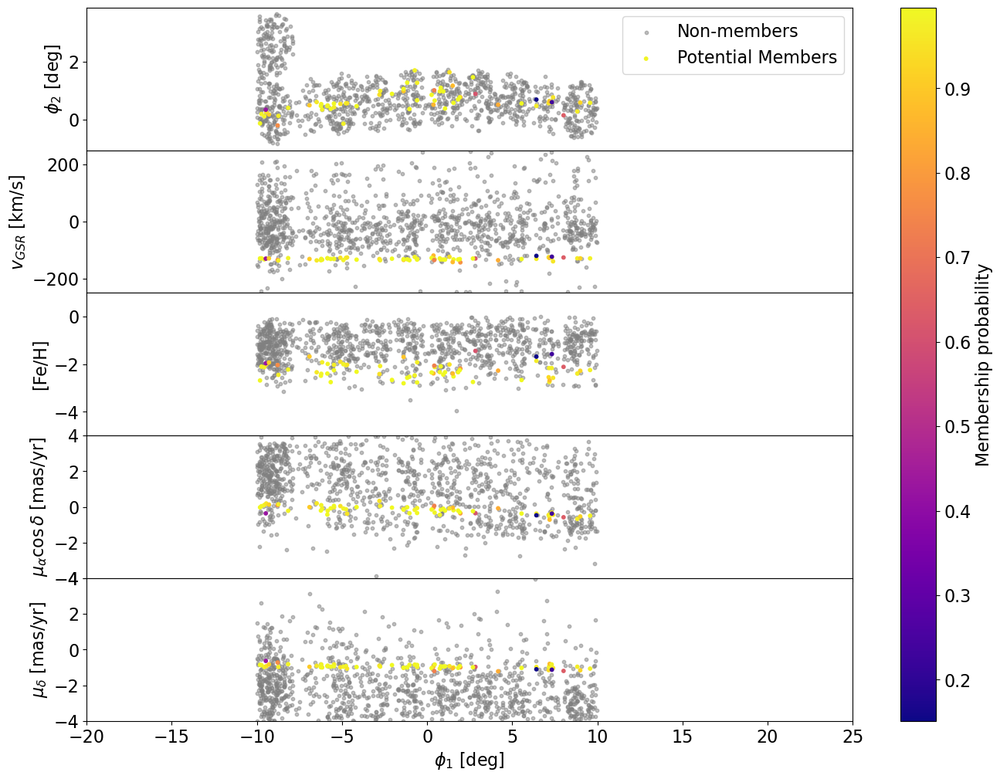

In [38]:
# Figure 3

fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)

ax[0].scatter(atlas_data_red['phi1'][stream_prob<=0.1], atlas_data_red['phi2'][stream_prob<=0.1],color='gray',alpha=0.5,
             label='Non-members',s=10)
cm = ax[0].scatter(atlas_data_red['phi1'][stream_prob>0.1], atlas_data_red['phi2'][stream_prob>0.1],c=stream_prob[stream_prob>0.1],cmap='plasma',
              label='Potential Members',s=10)

ax[1].scatter(atlas_data_red['phi1'][stream_prob<=0.1], atlas_data_red['vgsr'][stream_prob<=0.1],color='gray',alpha=0.5,s=10)
ax[1].scatter(atlas_data_red['phi1'][stream_prob>0.1], atlas_data_red['vgsr'][stream_prob>0.1],c=stream_prob[stream_prob>0.1],s=10,cmap='plasma')

ax[2].scatter(atlas_data_red['phi1'][stream_prob<=0.1], atlas_data_red['feh50'][stream_prob<=0.1],color='gray',alpha=0.5,s=10)
ax[2].scatter(atlas_data_red['phi1'][stream_prob>0.1], atlas_data_red['feh50'][stream_prob>0.1],c=stream_prob[stream_prob>0.1],s=10,cmap='plasma')

ax[3].scatter(atlas_data_red['phi1'][stream_prob<=0.1], atlas_data_red['pmra'][stream_prob<=0.1],color='gray',s=10,alpha=0.5)
ax[3].scatter(atlas_data_red['phi1'][stream_prob>0.1], atlas_data_red['pmra'][stream_prob>0.1],c=stream_prob[stream_prob>0.1],s=10,cmap='plasma')

ax[4].scatter(atlas_data_red['phi1'][stream_prob<=0.1], atlas_data_red['pmdec'][stream_prob<=0.1],s=10,color='gray',alpha=0.5)
ax[4].scatter(atlas_data_red['phi1'][stream_prob>0.1], atlas_data_red['pmdec'][stream_prob>0.1],s=10,c=stream_prob[stream_prob>0.1],cmap='plasma')


ax[0].set_ylabel('$\phi_2$ [deg]')
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]',ylim=(-250,250))
ax[2].set(ylabel=r'[Fe/H]',ylim=(-5,1))
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]',ylim=(-4,4))
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]', xlim=(-20,25),ylim=(-4,4))
plt.subplots_adjust(hspace=0)
ax[0].legend()

fig.colorbar(cm, ax=ax.ravel().tolist(),label='Membership probability')

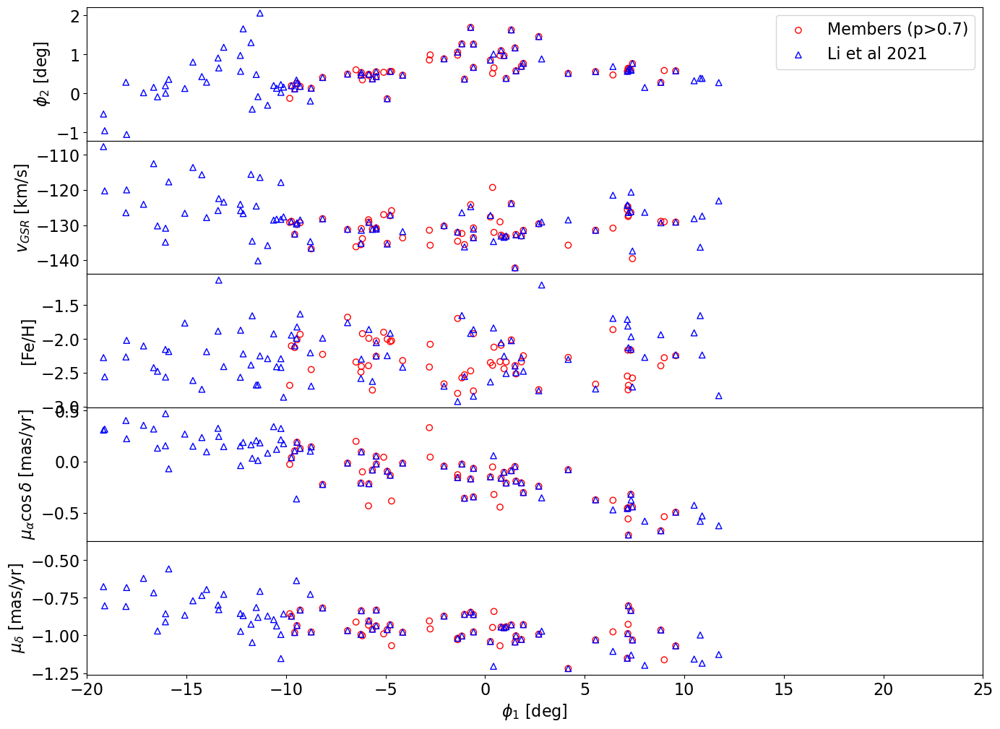

In [39]:
# Figure 4

fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)

ax[0].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['phi2'][stream_prob>0.8],facecolors='none', edgecolors='r',
              label=f'Members (p>{threshold})')
ax[0].scatter(atlas_mem['phi1'], atlas_mem['phi2'],facecolors='none',edgecolors='b',label='Li et al 2021',marker='^')

ax[1].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['vgsr'][stream_prob>0.8],facecolors='none', edgecolors='r')
ax[1].scatter(atlas_mem['phi1'], atlas_mem['vgsr'],facecolors='none',edgecolors='b',marker='^')

ax[2].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['feh50'][stream_prob>0.8],facecolors='none', edgecolors='r')
ax[2].scatter(atlas_mem['phi1'], atlas_mem['feh50'],facecolors='none',edgecolors='b',marker='^')

ax[3].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['pmra'][stream_prob>0.8],facecolors='none', edgecolors='r')
ax[3].scatter(atlas_mem['phi1'], atlas_mem['pmra'],facecolors='none',edgecolors='b',marker='^')

ax[4].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['pmdec'][stream_prob>0.8],facecolors='none', edgecolors='r')
ax[4].scatter(atlas_mem['phi1'], atlas_mem['pmdec'],facecolors='none',edgecolors='b',marker='^')


ax[0].set_ylabel('$\phi_2$ [deg]')
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]')
ax[2].set(ylabel=r'[Fe/H]',yticks=[-1.5,-2,-2.5,-3])
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]')
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]', xlim=(-20,25))
plt.subplots_adjust(hspace=0)
ax[0].legend()

NameError: name 'quad_f' is not defined

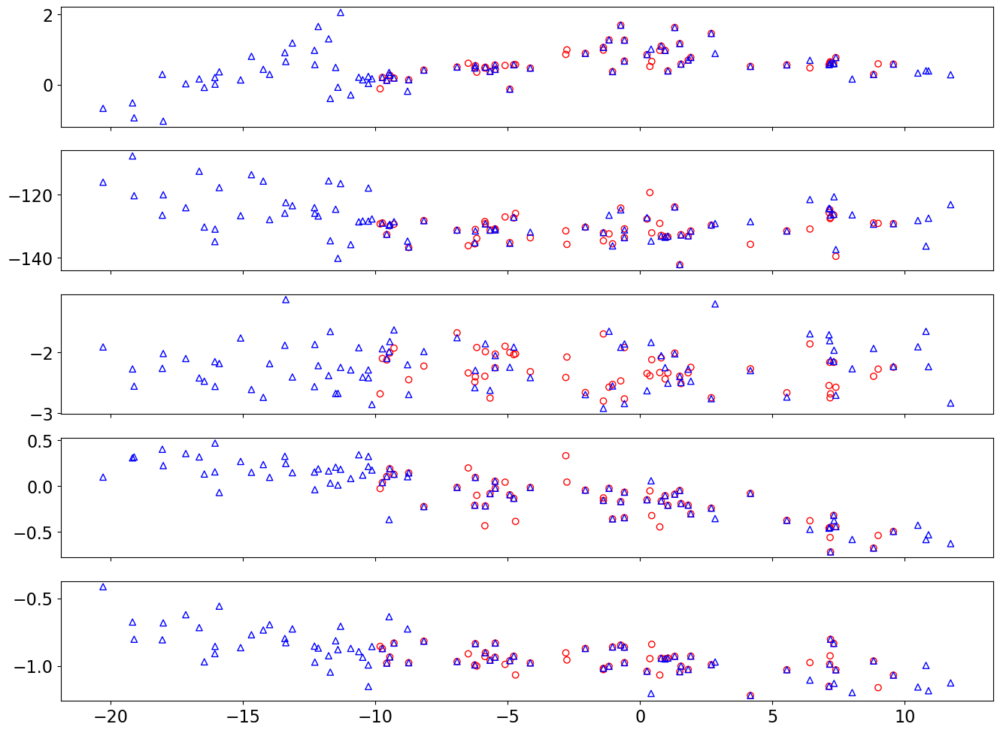

In [40]:
# Figure 4

fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)

ax[0].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['phi2'][stream_prob>0.8],facecolors='none', edgecolors='r',
              label=f'Members (p>{threshold})')
ax[0].scatter(atlas_mem['phi1'], atlas_mem['phi2'],facecolors='none',edgecolors='b',label='Li et al 2021',marker='^')

ax[1].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['vgsr'][stream_prob>0.8],facecolors='none', edgecolors='r')
ax[1].scatter(atlas_mem['phi1'], atlas_mem['vgsr'],facecolors='none',edgecolors='b',marker='^')

ax[2].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['feh50'][stream_prob>0.8],facecolors='none', edgecolors='r')
ax[2].scatter(atlas_mem['phi1'], atlas_mem['feh50'],facecolors='none',edgecolors='b',marker='^')

ax[3].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['pmra'][stream_prob>0.8],facecolors='none', edgecolors='r')
ax[3].scatter(atlas_mem['phi1'], atlas_mem['pmra'],facecolors='none',edgecolors='b',marker='^')

ax[4].scatter(atlas_data_red['phi1'][stream_prob>0.8], atlas_data_red['pmdec'][stream_prob>0.8],facecolors='none', edgecolors='r')
ax[4].scatter(atlas_mem['phi1'], atlas_mem['pmdec'],facecolors='none',edgecolors='b',marker='^')


x_arr = np.linspace(-20,25,100)


for i in range(20):
    ax[1].plot(x_arr,quad_f(x_arr,np.random.choice(chain[:,1]),np.random.choice(chain[:,2]),np.random.choice(chain[:,3])),color='g',alpha=0.2)
    ax[2].plot(x_arr,quad_f(x_arr,np.random.choice(chain[:,5]),np.random.choice(chain[:,6]),np.random.choice(chain[:,7])),color='g',alpha=0.2)
    ax[3].plot(x_arr,quad_f(x_arr,np.random.choice(chain[:,9]),np.random.choice(chain[:,10]),np.random.choice(chain[:,11])),color='g',alpha=0.2)
    ax[4].plot(x_arr,quad_f(x_arr,np.random.choice(chain[:,13]),np.random.choice(chain[:,14]),np.random.choice(chain[:,15])),color='g',alpha=0.2)


ax[1].plot(x_arr,quad_f(x_arr,meds['v1'],meds['v2'],meds['v3']),color='k')
ax[2].plot(x_arr,quad_f(x_arr,meds['feh1'],meds['feh2'],meds['feh3']),color='k')
ax[3].plot(x_arr,quad_f(x_arr,meds['pmra1'],meds['pmra2'],meds['pmra3']),color='k')
ax[4].plot(x_arr,quad_f(x_arr,meds['pmdec1'],meds['pmdec2'],meds['pmdec3']),color='k')
    

ax[0].set_ylabel('$\phi_2$ [deg]')
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]')
ax[2].set(ylabel=r'[Fe/H]',yticks=[-1.5,-2,-2.5,-3])
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]')
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]', xlim=(-20,25))
plt.subplots_adjust(hspace=0)
ax[0].legend()